In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
warnings.simplefilter('ignore')
DATA_PATH = "/media/maxine/c8f4bcb2-c1fe-4676-877d-8e476418f5e5/0-RPE-cell-timelapse/"

<h1 style = "font-size: 42px; text-align: center;"> Analysis Overview </h1>
<h2 style = "text-align: center;"> Exploring the cell cycle time series data, fluorescent channels and the drug response </h2>

## 1 - FUCCI Signal

In the extraction script, we filtered out less than $72dt$ to get rid of tracking errors.
For each well we have dataframes containing the cell image and fluroescent signals. These raw signals $( f_r , f_g ) $ are the observable functions of the phase $Z$. 

In [2]:
# Merged channels pickle is a dataframe that concatenates the raw signals from all the wells. Takes a 1m to load
merged_channels = pd.read_pickle("/media/maxine/c8f4bcb2-c1fe-4676-877d-8e476418f5e5/0-RPE-cell-timelapse/" + "merged_channels.pkl"); print(merged_channels.shape); merged_channels.sample()

(11168306, 10)


,CELL_ID,FRAME,CHANNEL_SUM,AREA,POSITION,PARENT,T_START,T_END,DELTA_T,condition
16975,0505.321,765,"[646800, 525624, 5697290, 10063456, 1795163]",482,"[1474.7, 843.7]",317,496,828,332,Nocodazole


In [6]:
normal_cells = merged_channels.query('condition == "Control"').copy()
normal_cells['WELL'] = normal_cells['CELL_ID'].apply(lambda cid: cid.split('.')[0])
normal_tracks = normal_cells.groupby('CELL_ID').apply(lambda track: pd.Series({'CHANNEL_SUM': track['CHANNEL_SUM'].tolist(), 'FRAME': track['FRAME'].tolist(),
                                                                                'PARENT': track['PARENT'].tolist()[0],
                                                                                'AREA': track['AREA'].tolist(),
                                                                                'WELL': track['WELL'].tolist()[0]} )).reset_index()
normal_tracks['tau'] = normal_tracks['FRAME'].apply(lambda fs: np.linspace(0, 1, len(fs)))

print(normal_cells.shape, normal_tracks.shape); normal_tracks.sample()

(4005067, 11) (20026, 7)


,CELL_ID,CHANNEL_SUM,FRAME,PARENT,AREA,WELL,tau
13608,0610.154,"[[449665, 2011516, 19243, 2692379, 995392], [2...","[713, 714, 715, 716, 717, 718, 719, 720, 721, ...",148,"[157, 164, 262, 281, 276, 328, 347, 337, 379, ...",0610,"[0.0, 0.006493506493506494, 0.0129870129870129..."


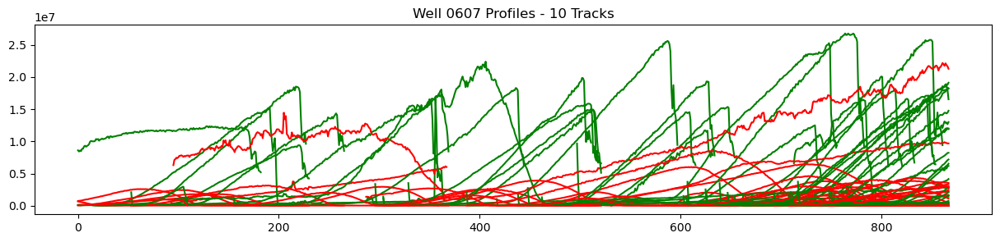

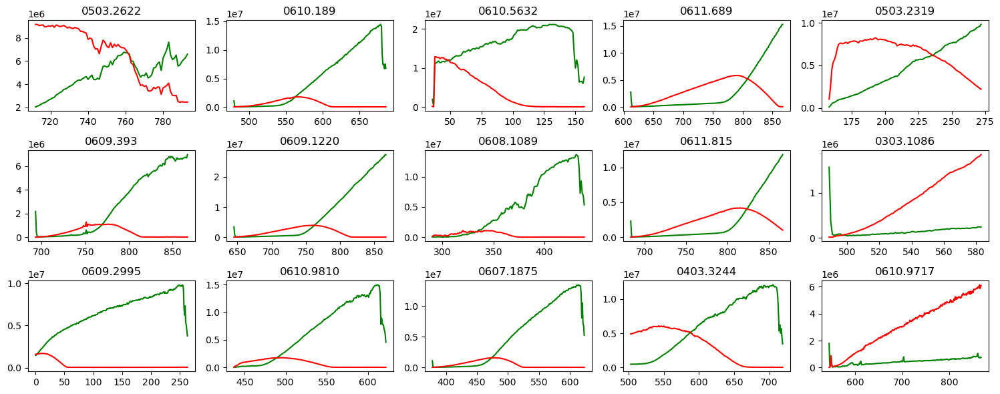

In [4]:
# Lets take a look at some FUCCI profiles 
fig, ax = plt.subplots(1, 1, figsize =(15, 3))
tracks = normal_tracks[normal_tracks['CELL_ID'].str.match('0607')].sample(50).reset_index(drop=True)
for i in range(50): track = np.array(tracks.loc[i, 'CHANNEL_SUM']); ax.plot(tracks.loc[i, 'FRAME'], track[:, 1], 'green', tracks.loc[i, 'FRAME'], track[:, 2], 'red'); ax.set_title('Well 0607 Profiles - 10 Tracks')
fig, ax = plt.subplots(3, 5, figsize = (15, 6)); ax = ax.flatten()
tracks = normal_tracks.sample(len(ax)).reset_index(drop=True)
for i in range(len(ax)): track = np.array(tracks.loc[i, 'CHANNEL_SUM']); ax[i].plot(tracks.loc[i, 'FRAME'], track[:, 1], 'green', tracks.loc[i, 'FRAME'], track[:, 2], 'red'); ax[i].set_title(f'{tracks.loc[i, "CELL_ID"]}')
plt.tight_layout(); plt.show()

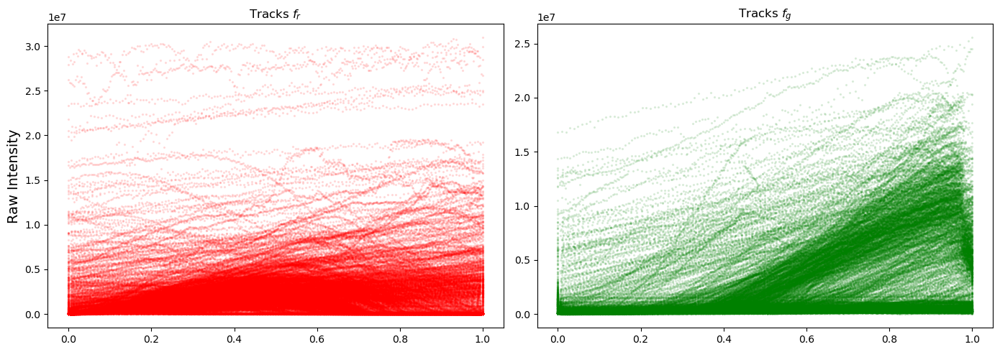

In [6]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5))
for row, track in normal_tracks.iterrows():
    if (row < 1e3): 
        ax[0].scatter(track['tau'], np.array(track['CHANNEL_SUM'])[:, 2], color = "red", s=2, alpha=0.1)
        ax[1].scatter(track['tau'], np.array(track['CHANNEL_SUM'])[:, 1], color = "green", s=2, alpha=0.1)
ax[0].set_title(f'Tracks $f_r$'); ax[1].set_title(f'Tracks $f_g$')
ax[0].set_ylabel('Raw Intensity', fontsize=14); plt.tight_layout();plt.show()

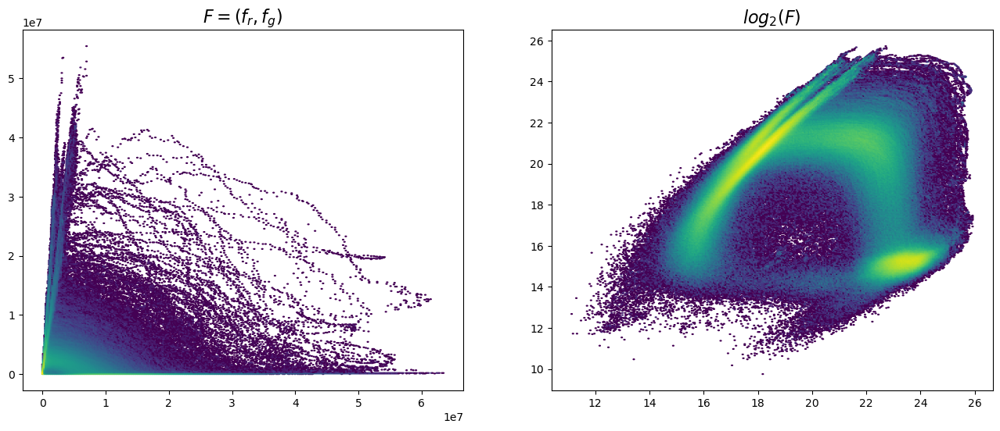

In [14]:
sum = np.array(normal_cells['CHANNEL_SUM'].tolist())
area = np.array(normal_cells['AREA'].tolist())
F = sum[:, [1, 2]]
F_bar = (sum/area.reshape(-1, 1))[:, [1, 2]]
fig, ax = plt.subplots(1, 2, figsize = (16, 6))
ax[0].hexbin(F[:, 0] , F[:, 1], bins='log', gridsize=(300, 300))
ax[1].hexbin(np.log2(F[:, 0]) ,np.log2(F[:, 1]), bins='log', gridsize=(300, 300))
ax[0].set_title('$F = (f_r, f_g)$',fontsize=16); ax[1].set_title('$log_2(F)$',fontsize=16)
plt.show()

## 2 - FUCCI Scale

We see that these raw signals are not normalized for background noise (starting at $2^{5}$) and express a greater dynamic range in log scale, previously shown in DeepCycle. 
However taking the logarithm increases the dynamic range of the background noise, leading to interesting questions about the proper scale of these tracks.

For the background noise normalization, we express the signal shifted and in units of an $\epsilon$ which can be k-th percentile of the signals distribution. Here we use the 1st percentile so we have $\epsilon = P_1 = (P_{1,r}, P_{1,g})$:
$$ F = (f_r, f_g), \quad \overline{F} = \dfrac{F}{A} = (\overline{f_r}, \overline{f_g})$$
$$ F^\prime = \dfrac{ \overline{F} - \epsilon}{\epsilon} $$

Then to deal with the increased dynamic range from log, we can softplus our new units of $\epsilon$ before passing them into the log:
$$ Softplus(x) = \dfrac{1}{\beta} * log(1 + exp(\beta * x))$$

$$ y = log_2(Softplus(\dfrac{ \overline{F} - \epsilon}{\epsilon})$$


In [21]:
# Make a standard process for each well
well_epsilon = normal_cells.groupby('WELL').apply(lambda cells: [np.percentile((np.array(cells['CHANNEL_SUM'].tolist())/cells['AREA'].values[:, np.newaxis])[:, 1], q=1),
                                                                 np.percentile((np.array(cells['CHANNEL_SUM'].tolist())/cells['AREA'].values[:, np.newaxis])[:, 2], q=1)])
normal_cells['epsilon'] = normal_cells['WELL'].apply(lambda well: well_epsilon[well])
normal_tracks['epsilon'] = normal_tracks['WELL'].apply(lambda well: well_epsilon[well])

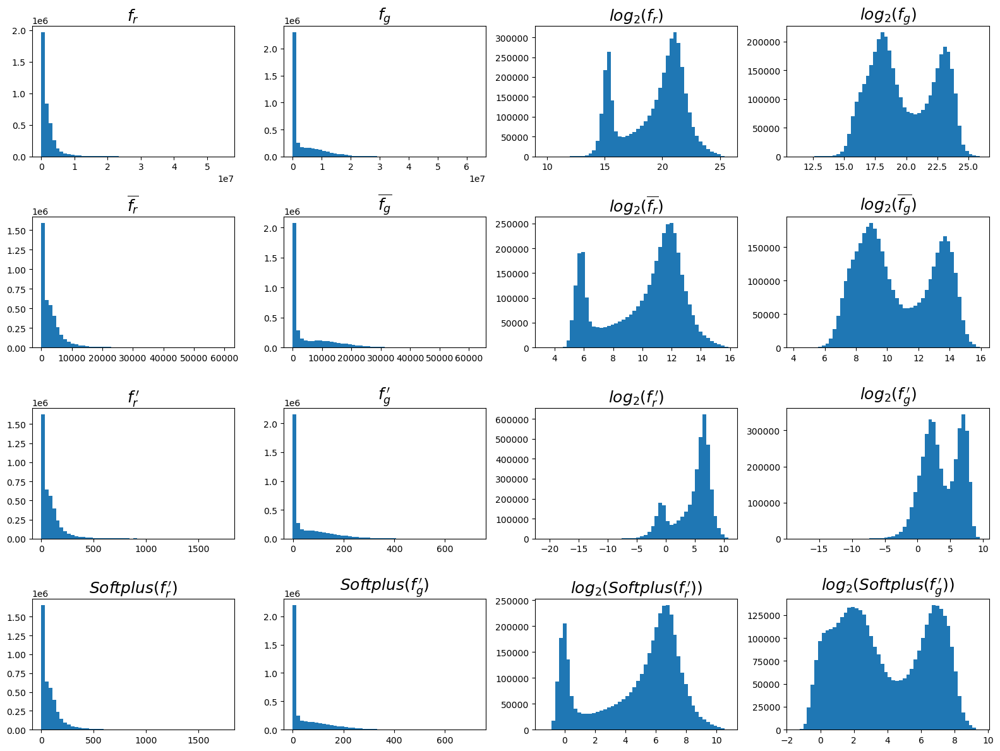

In [18]:
fig, ax = plt.subplots(4, 4, figsize=(16, 12))
ax = ax.flatten()
ax[0].hist(F[:, 1], bins=50)
ax[1].hist(F[:, 0], bins=50)
ax[2].hist(np.log2(F[:, 1]), bins=50)
ax[3].hist(np.log2(F[:, 0]), bins=50)

ax[4].hist(F_bar[:, 1], bins=50)
ax[5].hist(F_bar[:, 0], bins=50)
ax[6].hist(np.log2(F_bar[:, 1]), bins=50)
ax[7].hist(np.log2(F_bar[:, 0]), bins=50)

epsilon = np.array(normal_cells.epsilon.tolist())
F_prime = (F_bar - epsilon) / epsilon
ax[8].hist(F_prime[:, 1], bins=50)
ax[9].hist(F_prime[:, 0], bins=50)
ax[10].hist(np.log2(F_prime[:, 1]), bins=50)
ax[11].hist(np.log2(F_prime[:, 0]), bins=50)

softplus = lambda x, beta=1: np.where(beta*x < 20, (1/beta)*np.log(1+np.exp(beta*x)), x)
ax[12].hist(softplus(F_prime[:, 1]), bins=50)
ax[13].hist(softplus(F_prime[:, 0]), bins=50)
ax[14].hist(np.log2(softplus(F_prime[:, 1])), bins=50)
ax[15].hist(np.log2(softplus(F_prime[:, 0])), bins=50)

ax[0].set_title('$f_r$', fontsize=18)
ax[1].set_title('$f_g$', fontsize=18)
ax[0+2].set_title('$log_2(f_r)$', fontsize=18)
ax[1+2].set_title('$log_2(f_g)$', fontsize=18)
ax[4].set_title('$\overline{f_r}$', fontsize=18)
ax[5].set_title('$\overline{f_g}$', fontsize=18)
ax[4+2].set_title('$log_2(\overline{f_r})$', fontsize=18)
ax[5+2].set_title('$log_2(\overline{f_g})$', fontsize=18)
ax[8].set_title('$f_r^{\,\prime}$', fontsize=18)
ax[9].set_title('$f_g^{\,\prime}$', fontsize=18)
ax[8+2].set_title('$log_2(f_r^{\,\prime})$', fontsize=18)
ax[9+2].set_title('$log_2(f_g^{\,\prime})$', fontsize=18)
ax[12].set_title('$Softplus(f_r^{\,\prime})$', fontsize=18)
ax[13].set_title('$Softplus(f_g^{\,\prime})$', fontsize=18)
ax[12+2].set_title('$log_2(Softplus(f_r^{\,\prime}))$', fontsize=18)
ax[13+2].set_title('$log_2(Softplus(f_g^{\,\prime}))$', fontsize=18)
plt.tight_layout()
plt.show()

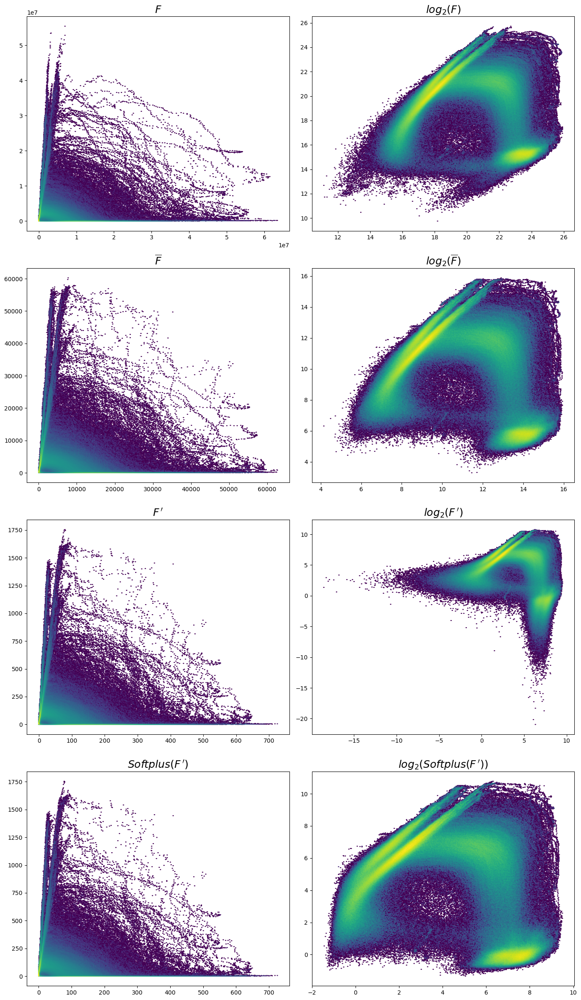

In [19]:
fig, ax = plt.subplots(4, 2, figsize=(14, 24))
ax = ax.flatten()
ax[0].hexbin(F[:, 0] , F[:, 1], bins='log', gridsize=(300, 300))
ax[1].hexbin(np.log2(F[:, 0]) ,np.log2(F[:, 1]), bins='log', gridsize=(300, 300))
ax[0+2].hexbin(F_bar[:, 0] , F_bar[:, 1], bins='log', gridsize=(300, 300))
ax[1+2].hexbin(np.log2(F_bar[:, 0]) ,np.log2(F_bar[:, 1]), bins='log', gridsize=(300, 300))
ax[0+4].hexbin(F_prime[:, 0] , F_prime[:, 1], bins='log', gridsize=(300, 300))
ax[1+4].hexbin(np.log2(F_prime[:, 0]) ,np.log2(F_prime[:, 1]), bins='log', gridsize=(300, 300))
ax[0+6].hexbin(softplus(F_prime[:, 0]) , softplus(F_prime[:, 1]), bins='log', gridsize=(300, 300))
ax[1+6].hexbin(np.log2(softplus(F_prime[:, 0])) ,np.log2(softplus(F_prime[:, 1])), bins='log', gridsize=(300, 300))

ax[0].set_title('$F$', fontsize=18)
ax[1].set_title('$log_2(F)$', fontsize=18)
ax[0+2].set_title('$\overline{F}$', fontsize=18)
ax[1+2].set_title('$log_2(\overline{F})$', fontsize=18)
ax[0+4].set_title('$F^{\,\prime}$', fontsize=18)
ax[1+4].set_title('$log_2(F^{\,\prime})$', fontsize=18)
ax[0+6].set_title('$Softplus(F^{\,\prime})$', fontsize=18)
ax[1+6].set_title('$log_2(Softplus(F^{\,\prime}))$', fontsize=18)
plt.tight_layout()
plt.show()

Reminder:  
$$ y = log_2(Softplus(\dfrac{ \overline{F} - \epsilon}{\epsilon})$$

In [34]:
import pandas as pd
merged_channels.sample()

,CELL_ID,FRAME,CHANNEL_SUM,AREA,POSITION,PARENT,condition
30707,0307.265,628,"[292996, 606100, 5740250, 14955697, 1356897]",714,"[1055.5, 673.0]",257,Palbociclib


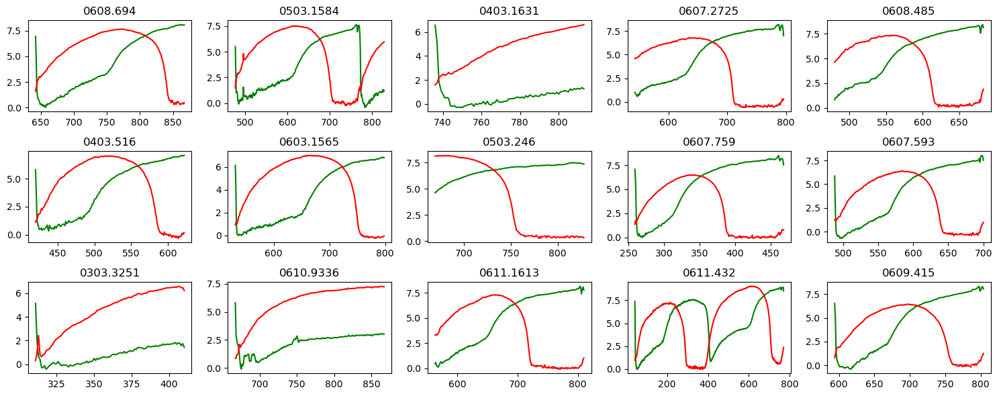

In [22]:
fig, ax = plt.subplots(3, 5, figsize = (15, 6)); ax = ax.flatten()
tracks = normal_tracks.sample(len(ax)).reset_index(drop=True)
for i in range(len(ax)):
    sum = np.array(tracks.loc[i, 'CHANNEL_SUM'])[:, [1, 2]]
    area = np.array(tracks.loc[i, 'AREA'])
    epsilon = np.array(tracks.loc[i, 'epsilon'])
    track = np.log2(softplus((sum/area[:, np.newaxis] - epsilon)/epsilon))

    ax[i].plot(tracks.loc[i, 'FRAME'], track[:, 0], 'green', tracks.loc[i, 'FRAME'], track[:, 1], 'red'); ax[i].set_title(f'{tracks.loc[i, "CELL_ID"]}')
plt.tight_layout(); plt.show()

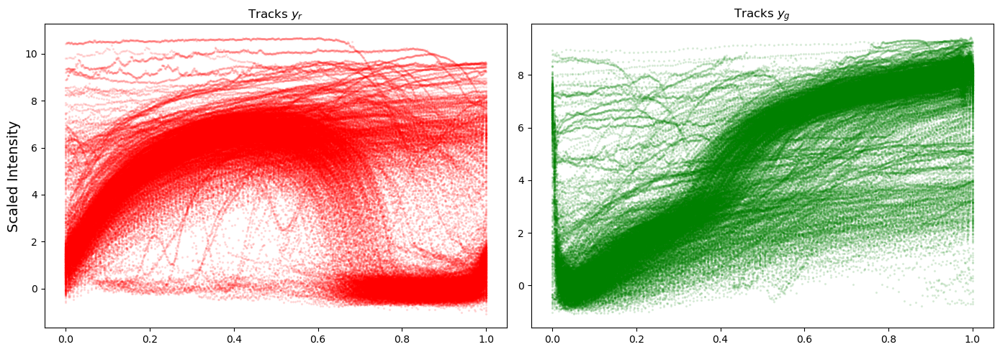

In [23]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5))
for row, track in normal_tracks.iterrows():
    if (row > 10e3 and row < 11e3): 
        sum = np.array(track['CHANNEL_SUM'])[:, [1, 2]]
        area = np.array(track['AREA'])
        epsilon = np.array(track['epsilon'])
        y = np.log2(softplus((sum/area[:, np.newaxis] - epsilon)/epsilon))
        ax[0].scatter(track['tau'], y[:, 1], color = "red", s=2, alpha=0.1)
        ax[1].scatter(track['tau'], y[:, 0], color = "green", s=2, alpha=0.1)
ax[0].set_title(f'Tracks $y_r$'); ax[1].set_title(f'Tracks $y_g$'); ax[0].set_ylabel('Scaled Intensity', fontsize=14); plt.tight_layout(); plt.show()

## 3 - Min-Max Normalization

One more thing we can do is normalize the signal trackwise with $min-max$ normalization for higher model convergence and numerical stability or directly on the whole set tracks or per track, so the maximum of each signal is consistent from track to track

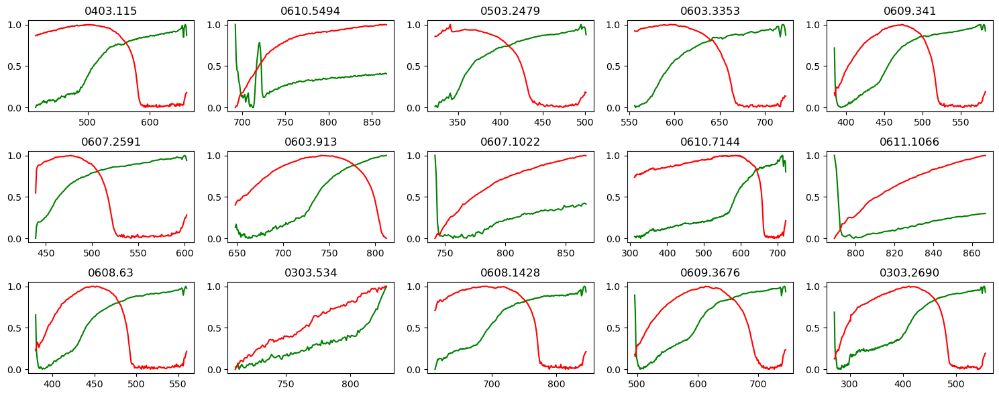

In [24]:
fig, ax = plt.subplots(3, 5, figsize = (15, 6)); ax = ax.flatten()
tracks = normal_tracks.sample(len(ax)).reset_index(drop=True)
for i in range(len(ax)):
    sum = np.array(tracks.loc[i, 'CHANNEL_SUM'])[:, [1, 2]]; area = np.array(tracks.loc[i, 'AREA']); epsilon = np.array(tracks.loc[i, 'epsilon'])
    track = np.log2(softplus((sum/area[:, np.newaxis] - epsilon)/epsilon))
    track[:, 0] = mm.fit_transform(track[:, 0].reshape(-1, 1)).flatten()
    track[:, 1] = mm.fit_transform(track[:, 1].reshape(-1, 1)).flatten()
    ax[i].plot(tracks.loc[i, 'FRAME'], track[:, 0], 'green', tracks.loc[i, 'FRAME'], track[:, 1], 'red'); ax[i].set_title(f'{tracks.loc[i, "CELL_ID"]}')
plt.tight_layout(); plt.show()

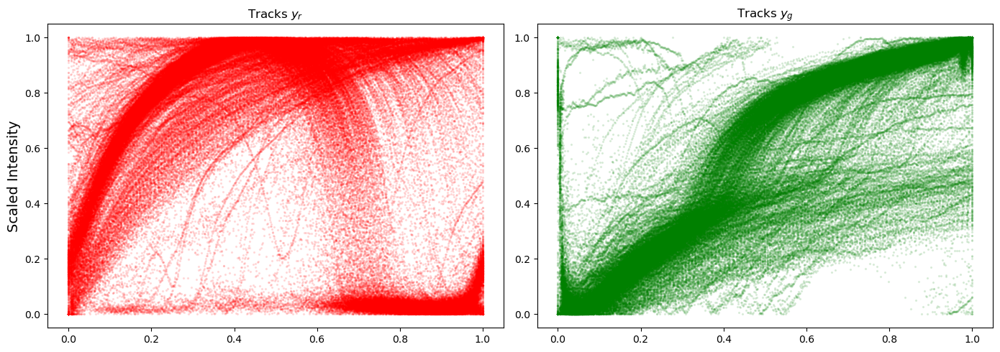

In [25]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5))
for row, track in normal_tracks.iterrows():
    if (row > 10e3 and row < 11e3): 
        sum = np.array(track['CHANNEL_SUM'])[:, [1, 2]]
        area = np.array(track['AREA'])
        epsilon = np.array(track['epsilon'])
        y = np.log2(softplus((sum/area[:, np.newaxis] - epsilon)/epsilon))
        y[:, 0] = mm.fit_transform(y[:, 0].reshape(-1, 1)).flatten()
        y[:, 1] = mm.fit_transform(y[:, 1].reshape(-1, 1)).flatten()
        ax[0].scatter(track['tau'], y[:, 1], color = "red", s=2, alpha=0.1)
        ax[1].scatter(track['tau'], y[:, 0], color = "green", s=2, alpha=0.1)
ax[0].set_title(f'Tracks $y_r$'); ax[1].set_title(f'Tracks $y_g$'); ax[0].set_ylabel('Scaled Intensity', fontsize=14); plt.tight_layout(); plt.show()

We can see this scaled FUCCI is more normalized accross tracks and a more informative representation. However we can see there are multiple clusters of FUCCI profiles and we would like to select tracks with a full FUCCI profile. From TrackMate, a track does not equal an M-M FUCCI profile and for model training this is what we would like to have. Let's try to isolate the cluster of M-M tracks.

## 4- K-Means isolation of M-M Track Cluster

In [57]:
normal_tracks['fucci1'] = normal_tracks.apply(lambda track: np.log2(softplus((np.array(track['CHANNEL_SUM'])[:, 1]/np.array(track['AREA']) - np.array(track['epsilon'])[0])/np.array(track['epsilon'])[0])), axis=1) 
normal_tracks['fucci2'] = normal_tracks.apply(lambda track: np.log2(softplus((np.array(track['CHANNEL_SUM'])[:, 2]/np.array(track['AREA']) - np.array(track['epsilon'])[1])/np.array(track['epsilon'])[1])), axis=1) 
normal_tracks['fucci'] = normal_tracks.apply(lambda track: np.concatenate([track['fucci2'], track['fucci1']]), axis=1)
normal_tracks['fucci_interpolated'] = normal_tracks['fucci'].apply(lambda track: np.interp(np.linspace(0, len(track)-1, 100), np.arange(len(track)), track))

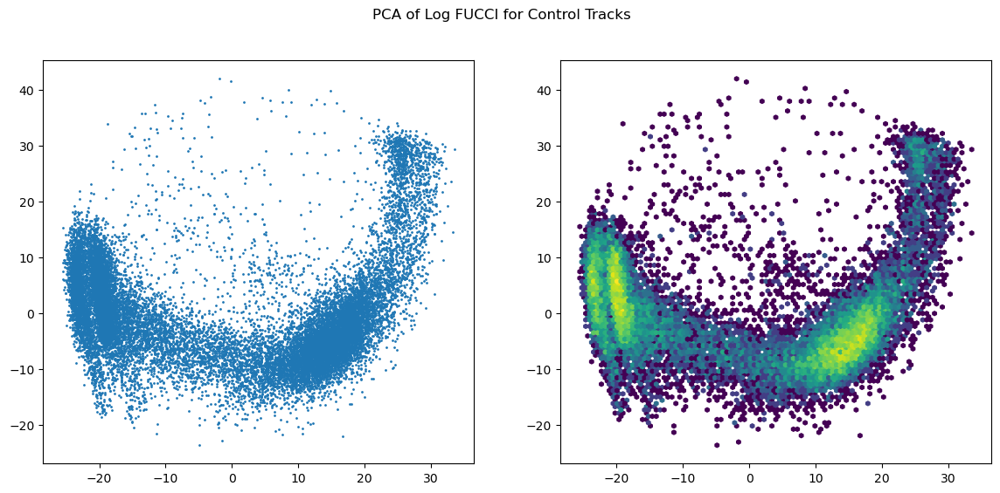

In [58]:
from sklearn.decomposition import PCA
K = np.stack(normal_tracks['fucci_interpolated'])
pca = PCA(2); K_p = pca.fit_transform(K)
fig, ax = plt.subplots(1, 2, figsize= (14, 6))
ax[0].scatter(K_p[:, 0], K_p[:, 1], s = 1)
ax[1].hexbin(K_p[:, 0], K_p[:, 1], bins='log')
fig.suptitle('PCA of Log FUCCI for Control Tracks')
plt.show()

(1776,)
(5850,)
(6401,)
(3260,)
(2739,)


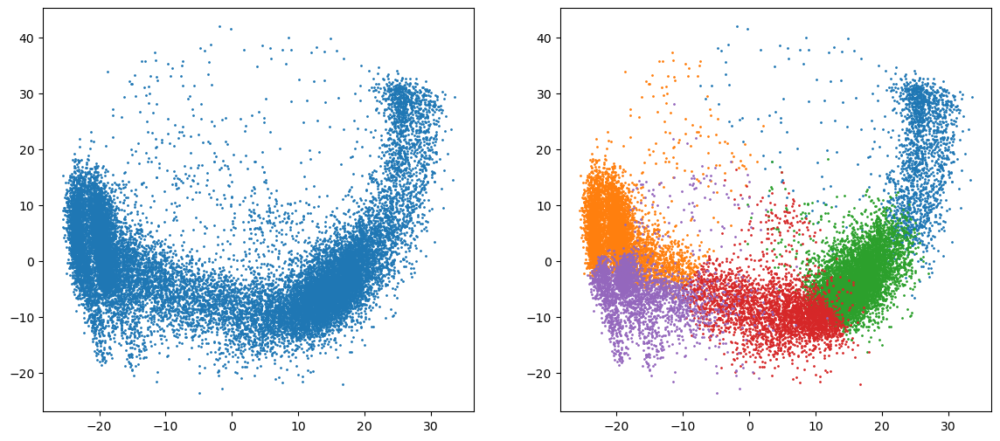

In [59]:
from sklearn.cluster import DBSCAN, KMeans
dbscan = DBSCAN(eps=1, min_samples=20)
db_clusters = dbscan.fit_predict(K)
kmeans = KMeans(n_clusters=5) 
k_clusters = kmeans.fit_predict(K)

ax[0].set_title('DBSCAN Clusters');ax[0].set_title('K-Means Clusters')
fig, ax = plt.subplots(1, 2, figsize = (14, 6))
for cluster in np.unique(db_clusters):
    track_idx = np.where(db_clusters == cluster)
    ax[0].scatter(K_p[track_idx, 0],K_p[track_idx, 1], s=1)
for cluster in np.unique(k_clusters):
    track_idx = np.where(k_clusters == cluster)
    print(track_idx[0].shape)
    ax[1].scatter(K_p[track_idx, 0],K_p[track_idx, 1],s=1)

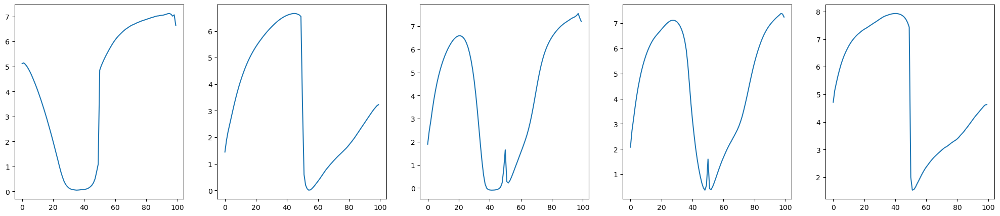

In [60]:
# Taking a look at the tracks of the Kmeans centroids
fig, ax = plt.subplots(1, len(kmeans.cluster_centers_), figsize = (5*len(kmeans.cluster_centers_), 5))
for i in range(len(kmeans.cluster_centers_)):
    ax[i].plot(kmeans.cluster_centers_[i])

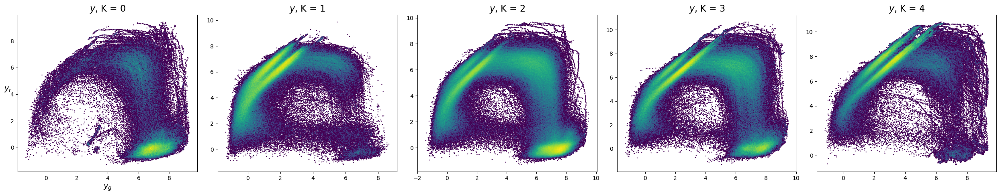

In [61]:
# Fucci Manifold and Density Plots
normal_tracks['k_clusters'] = k_clusters
normal_cells_clustered = normal_tracks[['CELL_ID', 'k_clusters', 'fucci1', 'fucci2']].explode(['fucci1', 'fucci2'])
fig, ax = plt.subplots(1, len(kmeans.cluster_centers_), figsize = (5*len(kmeans.cluster_centers_), 5))

for i in range(len(kmeans.cluster_centers_)):
    cluster = normal_cells_clustered.query(f'k_clusters == {i}')
    ax[i].hexbin(cluster['fucci1'],cluster['fucci2'], bins='log', gridsize=(300, 300)); ax[i].set_title(f'$y$, K = {i}',fontsize=16)
ax[0].set_xlabel('$y_g$', fontsize=14); ax[0].set_ylabel('$y_r$', rotation=0, fontsize=14)
plt.tight_layout(); plt.show()

In [49]:
print("Average Track First Frame:")
for i in range(len(kmeans.cluster_centers_)): print('Cluster', i, ':', np.round(normal_tracks[normal_tracks['k_clusters'] == i]['FRAME'].apply(lambda frame: frame[0]).mean()))

Average Track First Frame:
Cluster 0 : 447.0
Cluster 1 : 628.0
Cluster 2 : 370.0
Cluster 3 : 379.0
Cluster 4 : 525.0


## We can do the same for the already MinMaxed FUCCI

In [50]:
normal_tracks['fucci1_mm'] = normal_tracks.apply(lambda track: mm.fit_transform(np.log2(softplus((np.array(track['CHANNEL_SUM'])[:, 1]/np.array(track['AREA']) - epsilon[0])/epsilon[0])
                            ).reshape(-1, 1)).flatten(), axis=1) 
normal_tracks['fucci2_mm'] = normal_tracks.apply(lambda track: mm.fit_transform(np.log2(softplus((np.array(track['CHANNEL_SUM'])[:, 2]/np.array(track['AREA']) - epsilon[1])/epsilon[1])
                            ).reshape(-1, 1)).flatten(), axis=1) 
normal_tracks['fucci_mm'] = normal_tracks.apply(lambda track: np.concatenate([track['fucci2_mm'], track['fucci1_mm']]), axis=1)
normal_tracks['fucci_interpolated_mm'] = normal_tracks['fucci_mm'].apply(lambda track: np.interp(np.linspace(0, len(track)-1, 100), np.arange(len(track)), track))

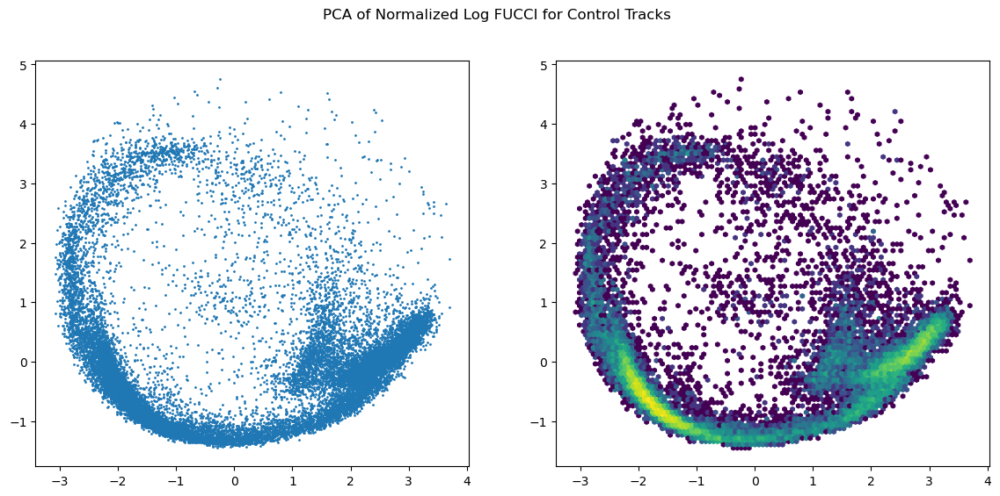

In [51]:
from sklearn.decomposition import PCA
K = np.stack(normal_tracks['fucci_interpolated_mm'])
pca = PCA(2); K_p = pca.fit_transform(K)
fig, ax = plt.subplots(1, 2, figsize= (14, 6))
ax[0].scatter(K_p[:, 0], K_p[:, 1], s = 1)
ax[1].hexbin(K_p[:, 0], K_p[:, 1], bins='log')
fig.suptitle('PCA of Normalized Log FUCCI for Control Tracks')
plt.show()

(3924,)
(4400,)
(1791,)
(4179,)
(5732,)


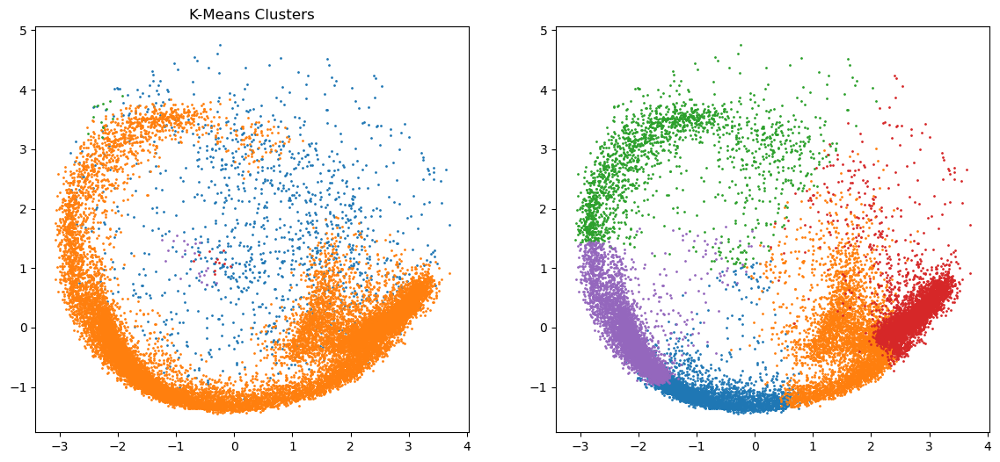

In [52]:
from sklearn.cluster import DBSCAN, KMeans
dbscan = DBSCAN(eps=1, min_samples=10)
db_clusters = dbscan.fit_predict(K)
kmeans = KMeans(n_clusters=5) 
k_clusters = kmeans.fit_predict(K)

fig, ax = plt.subplots(1, 2, figsize = (14, 6))
ax[0].set_title('DBSCAN Clusters');ax[0].set_title('K-Means Clusters')
for cluster in np.unique(db_clusters):
    track_idx = np.where(db_clusters == cluster)
    ax[0].scatter(K_p[track_idx, 0],K_p[track_idx, 1], s=1)
for cluster in np.unique(k_clusters):
    track_idx = np.where(k_clusters == cluster)
    print(track_idx[0].shape)
    ax[1].scatter(K_p[track_idx, 0],K_p[track_idx, 1],s=1)

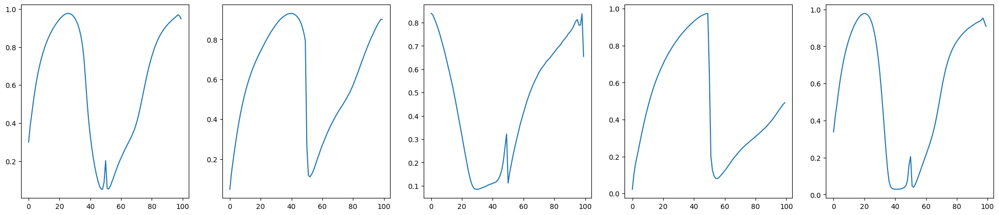

In [53]:
# Taking a look at the tracks of the Kmeans centroids
fig, ax = plt.subplots(1, len(kmeans.cluster_centers_), figsize = (5*len(kmeans.cluster_centers_), 5))
for i in range(len(kmeans.cluster_centers_)):
    ax[i].plot(kmeans.cluster_centers_[i])

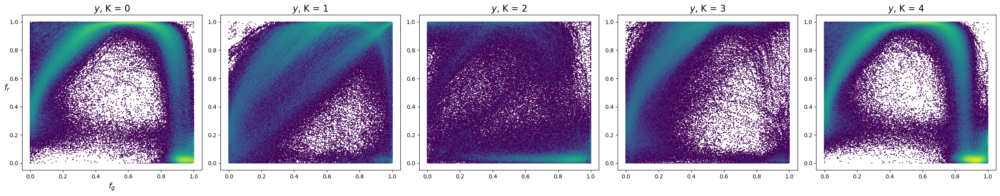

In [54]:
# Fucci Manifold and Density Plots
normal_tracks['k_clusters_mm'] = k_clusters
normal_cells_clustered = normal_tracks[['CELL_ID', 'k_clusters_mm', 'fucci1_mm', 'fucci2_mm']].explode(['fucci1_mm', 'fucci2_mm'])
fig, ax = plt.subplots(1, len(kmeans.cluster_centers_), figsize = (5 * len(kmeans.cluster_centers_), 5))

for i in range(len(kmeans.cluster_centers_)):
    cluster = normal_cells_clustered.query(f'k_clusters_mm == {i}')
    ax[i].hexbin(cluster['fucci1_mm'],cluster['fucci2_mm'], bins='log', gridsize=(300, 300)); ax[i].set_title(f'$y$, K = {i}',fontsize=16)
ax[0].set_xlabel('$f_g$', fontsize=14); ax[0].set_ylabel('$f_r$', rotation=0, fontsize=14)
plt.tight_layout(); plt.show()

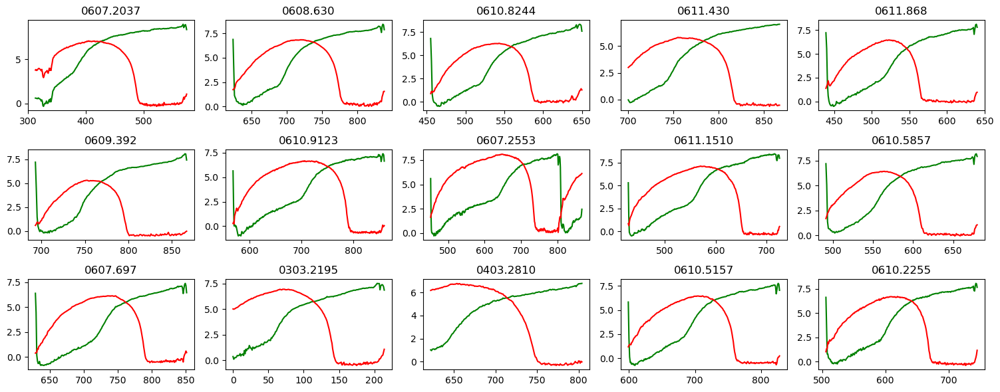

In [62]:
fig, ax = plt.subplots(3, 5, figsize = (15, 6)); ax = ax.flatten()
tracks = normal_tracks.query('k_clusters == 2').sample(len(ax)).reset_index(drop=True)
for i in range(len(ax)): ax[i].plot(tracks.loc[i, 'FRAME'], tracks.loc[i, "fucci1"], 'green', tracks.loc[i, 'FRAME'], tracks.loc[i, "fucci2"], 'red'); ax[i].set_title(f'{tracks.loc[i, "CELL_ID"]}')
plt.tight_layout(); plt.show()

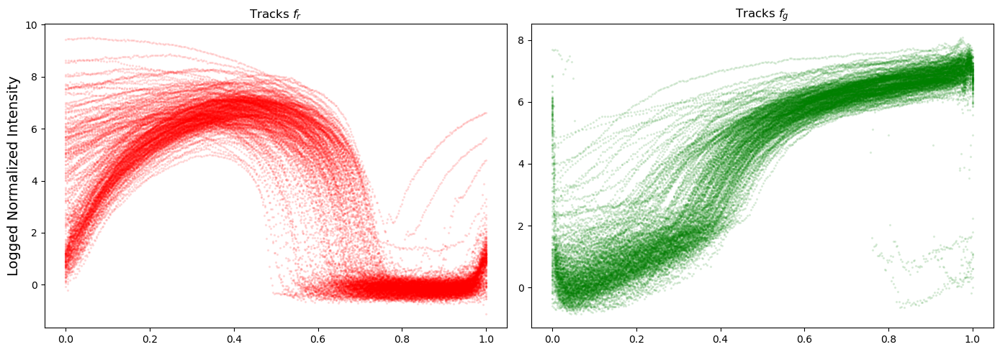

In [67]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5))
for row, track in normal_tracks.query('k_clusters == 2').iterrows():
    if (row < 1e3):
        ax[0].scatter(track['tau'], track['fucci2'], color = "red", s=2, alpha=0.1)
        ax[1].scatter(track['tau'], track['fucci1'], color = "green", s=2, alpha=0.1)
ax[0].set_title(f'Tracks $f_r$'); ax[1].set_title(f'Tracks $f_g$'); ax[0].set_ylabel('Logged Normalized Intensity', fontsize=14); plt.tight_layout(); plt.show()

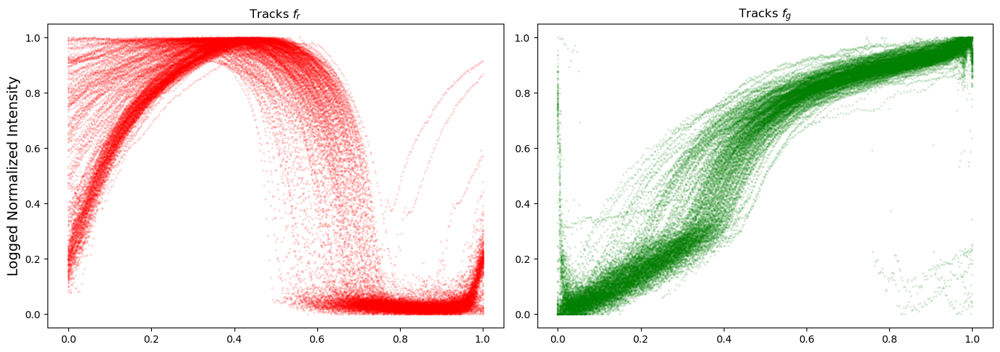

In [66]:
fig, ax = plt.subplots(1, 2, figsize = (14, 5))
for row, track in normal_tracks.query('k_clusters == 2').iterrows():
    if (row < 1e3):
        ax[0].scatter(track['tau'], track['fucci2_mm'], color = "red", s=2, alpha=0.1)
        ax[1].scatter(track['tau'], track['fucci1_mm'], color = "green", s=2, alpha=0.1)
ax[0].set_title(f'Tracks $f_r$'); ax[1].set_title(f'Tracks $f_g$'); ax[0].set_ylabel('Logged Normalized Intensity', fontsize=14); plt.tight_layout(); plt.show()

### This new method of K-Means clustering seems to be exceptional and yields to a 42.5 % Track Retention

In [68]:
good_tracks = normal_tracks.query('k_clusters == 2').copy()
good_cells = good_tracks[['CELL_ID', 'k_clusters', 'tau', 'fucci1', 'fucci2', 'fucci1_mm', 'fucci2_mm']].explode(['tau', 'fucci1', 'fucci2', 'fucci1_mm', 'fucci2_mm'])
len(good_tracks), len(good_cells)

(6401, 1464728)

# Final Fucci Manifolds

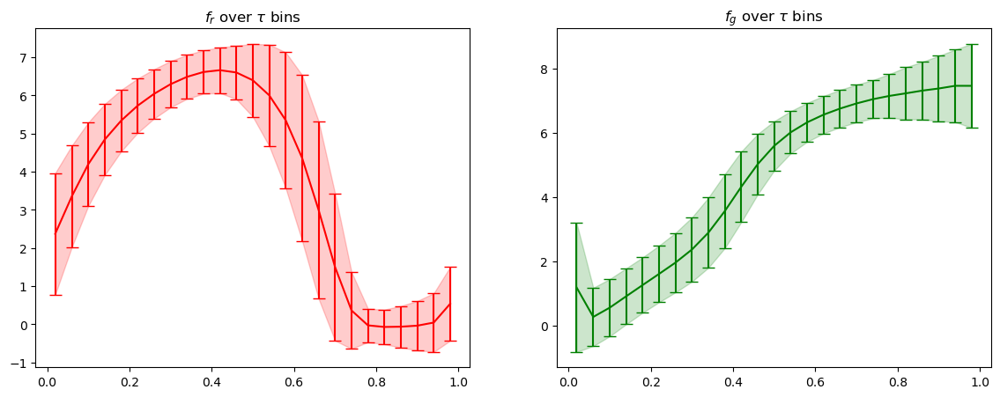

In [69]:
good_cells['bins'] = pd.cut(good_cells['tau'], bins = 25)
result = good_cells.groupby('bins')[['fucci1', 'fucci2']].agg(['mean', 'std']).reset_index(); bin_centers = good_cells['bins'].apply(lambda x: x.mid).drop_duplicates()

# Extracting fucci1 data
fucci1_mean = result['fucci1']['mean'].apply(lambda x: x) 
fucci1_std = result['fucci1']['std'] 
# Extracting fucci2 data
fucci2_mean = result['fucci2']['mean'].apply(lambda x: x)  # Unpacking the list
fucci2_std = result['fucci2']['std']  # Assuming the standard deviation was stored similarly

fig, ax = plt.subplots(1, 2, figsize = (14, 5))
ax[0].errorbar(bin_centers, fucci2_mean, yerr=fucci2_std, fmt='', capsize=5, color='red', label='fucci2 Mean')
ax[0].fill_between(bin_centers, fucci2_mean - fucci2_std, fucci2_mean + fucci2_std, color='red', alpha=0.2)
ax[1].errorbar(bin_centers, fucci1_mean, yerr=fucci1_std, fmt='', capsize=5, color='green', label='fucci1 Mean')
ax[1].fill_between(bin_centers, fucci1_mean - fucci1_std, fucci1_mean + fucci1_std, color='green', alpha=0.2)
ax[0].set_title('$f_r$ over $\\tau$ bins'); ax[1].set_title('$f_g$ over $\\tau$ bins'); plt.show()

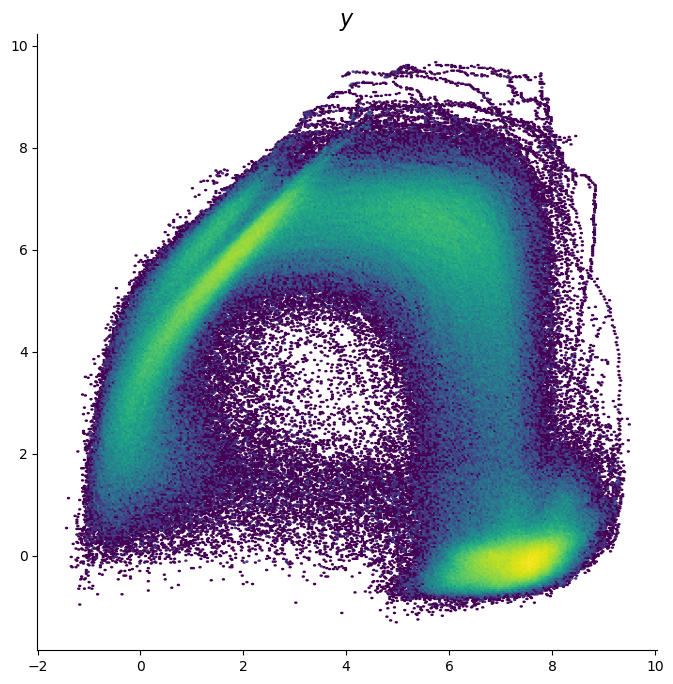

In [70]:
signal = good_cells[['fucci1', 'fucci2']].values
tau = good_cells['tau'].values
fig, ax = plt.subplots(1, 1, figsize = (8, 8))
ax.hexbin(signal[:, 0],signal[:, 1], bins='log', gridsize=(300, 300)); ax.set_title(f'$y$',fontsize=16)
ax.spines[['right', 'top']].set_visible(False)
plt.show()

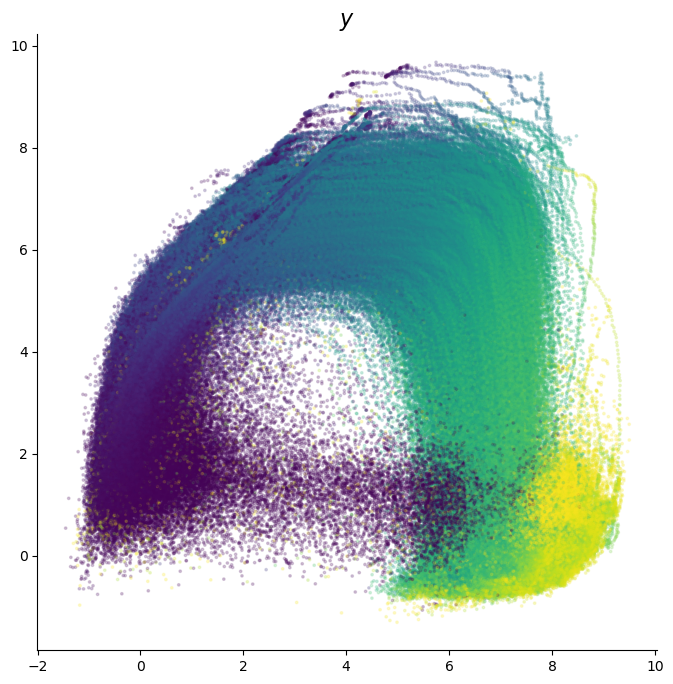

In [71]:
signal = good_cells[['fucci1', 'fucci2']].values
tau = good_cells['tau'].values
fig, ax = plt.subplots(1, 1, figsize = (8, 8))
sc = ax.scatter(signal[:, 0], signal[:, 1], s=3, alpha=0.2, c=tau); ax.set_title('$y$ ',fontsize=16)
#plt.colorbar(sc)
ax.spines[['right', 'top']].set_visible(False)
plt.show()

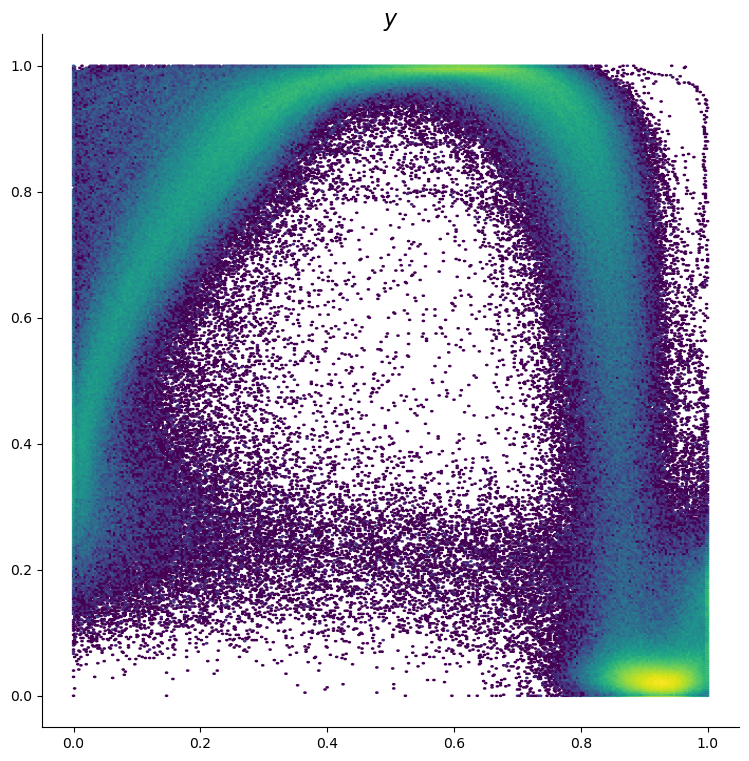

In [72]:
signal = good_cells[['fucci1_mm', 'fucci2_mm']].values
tau = good_cells['tau'].values
fig, ax = plt.subplots(1, 1, figsize = (9, 9))
ax.hexbin(signal[:, 0],signal[:, 1], bins='log', gridsize=(300, 300)); ax.set_title(f'$y$',fontsize=16)
ax.spines[['right', 'top']].set_visible(False)
plt.show()

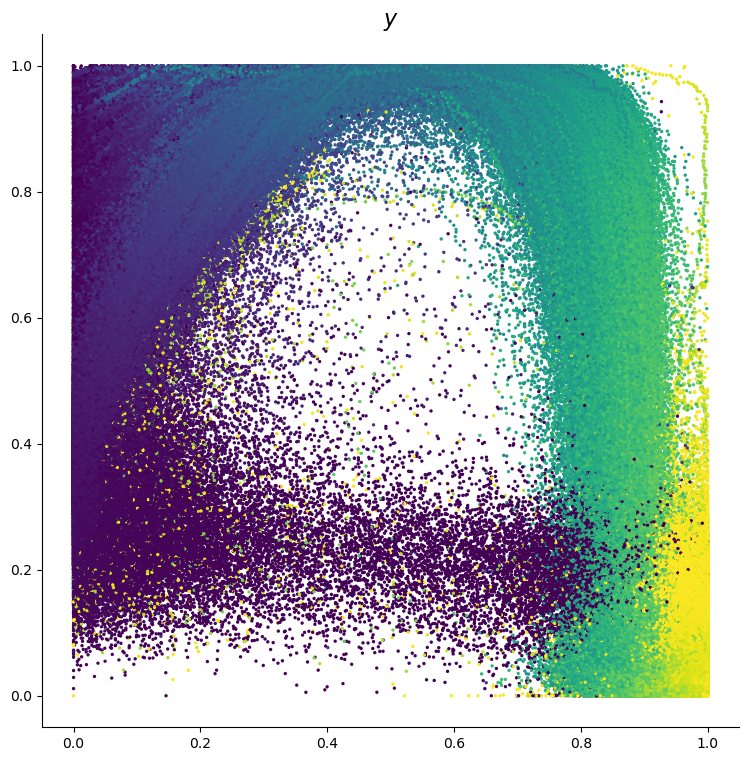

In [73]:
signal = good_cells[['fucci1_mm', 'fucci2_mm']].values
tau = good_cells['tau'].values
fig, ax = plt.subplots(1, 1, figsize = (9, 9))
sc = ax.scatter(signal[:, 0], signal[:, 1], s=2, alpha=1, c=tau); ax.set_title('$y$ ',fontsize=16)
ax.spines[['right', 'top']].set_visible(False)
plt.show() 

In [76]:
# Save for filtering
good_tracks['CELL_ID'].reset_index(drop=True).to_csv('full_tracks.csv')

## Lets do the per well, per condition, per concentration

In [49]:
merged_channels['WELL'] = merged_channels['CELL_ID'].apply(lambda cid: cid.split('.')[0])

,CELL_ID,FRAME,CHANNEL_SUM,AREA,POSITION,PARENT,T_START,T_END,DELTA_T,condition
26055,0508.586,387,"[632626, 7045897, 52662, 14590550, 2169060]",788,"[276.3, 966.4]",585,58,616,558,Nocodazole


merged